In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
import shutil
import random
import json
import math
import copy
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

from sklearn.model_selection import train_test_split

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [4]:
sidd_drive_data_path = "/content/drive/MyDrive/PixelClear/datasets/sidd/SIDD_Medium_Srgb/Data"
local_extract_root   = "/content/datasets"
sidd_local_dir       = "/content/datasets/SIDD_Medium_Srgb/Data"

print("SIDD Drive source path :", sidd_drive_data_path)
print("Local extract folder   :", local_extract_root)
print("Local SIDD data folder :", sidd_local_dir)

SIDD Drive source path : /content/drive/MyDrive/PixelClear/datasets/sidd/SIDD_Medium_Srgb/Data
Local extract folder   : /content/datasets
Local SIDD data folder : /content/datasets/SIDD_Medium_Srgb/Data


In [5]:
os.makedirs(local_extract_root, exist_ok=True)

if not os.path.exists(sidd_drive_data_path):
    raise FileNotFoundError(
        f"SIDD source folder not found at: {sidd_drive_data_path}\n"
        f"Please check the exact Drive path."
    )

local_sidd_root = os.path.dirname(sidd_local_dir)

if os.path.exists(sidd_local_dir):
    print("SIDD dataset already copied to local storage.")
else:
    print("Copying SIDD dataset from Drive to local storage...")
    os.makedirs(local_sidd_root, exist_ok=True)
    shutil.copytree(sidd_drive_data_path, sidd_local_dir, dirs_exist_ok=True)
    print("Copy completed.")

SIDD dataset already copied to local storage.


In [6]:
def show_folder_tree(root_path, max_depth=2, max_files=5):
    root_path = os.path.abspath(root_path)
    for root, dirs, files in os.walk(root_path):
        level = root.replace(root_path, "").count(os.sep)
        if level > max_depth:
            continue
        indent = " " * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        subindent = " " * 4 * (level + 1)
        for f in files[:max_files]:
            print(f"{subindent}{f}")

In [7]:
sidd_data_path = Path(sidd_local_dir)
sample_folders = sorted([p for p in sidd_data_path.iterdir() if p.is_dir()])

print("Number of sample folders found:", len(sample_folders))
print("\nFirst 10 sample folders:")
for f in sample_folders[:10]:
    print(f.name)

Number of sample folders found: 160

First 10 sample folders:
0001_001_S6_00100_00060_3200_L
0002_001_S6_00100_00020_3200_N
0003_001_S6_00100_00060_3200_H
0004_001_S6_00100_00060_4400_L
0005_001_S6_00100_00060_4400_N
0006_001_S6_00100_00060_4400_H
0007_001_S6_00100_00100_5500_L
0008_001_S6_00100_00100_5500_N
0010_001_S6_00800_00350_3200_N
0011_001_S6_00800_00500_5500_L


In [8]:
def find_sidd_pairs_all(data_dir):
    data_dir = Path(data_dir)
    pairs = []
    unmatched_items = []

    for folder in sorted(data_dir.iterdir()):
        if not folder.is_dir():
            continue
        png_files = sorted(list(folder.glob("*.PNG")) + list(folder.glob("*.png")))
        noisy_dict = {}
        gt_dict    = {}

        for f in png_files:
            name_upper = f.name.upper()
            if "NOISY_SRGB" in name_upper:
                key = f.stem.split("_")[-1]
                noisy_dict[key] = str(f)
            elif "GT_SRGB" in name_upper:
                key = f.stem.split("_")[-1]
                gt_dict[key] = str(f)

        common_keys = sorted(set(noisy_dict.keys()) & set(gt_dict.keys()))
        if not common_keys:
            unmatched_items.append(folder.name)
            continue
        for key in common_keys:
            pairs.append((noisy_dict[key], gt_dict[key]))

    return pairs, unmatched_items


pairs, unmatched_items = find_sidd_pairs_all(sidd_local_dir)

print("Matched pairs     :", len(pairs))
print("Unmatched entries :", len(unmatched_items))

Matched pairs     : 320
Unmatched entries : 0


In [9]:
def load_image_rgb(path):
    img = Image.open(path).convert("RGB")
    return np.array(img).astype(np.float32) / 255.0

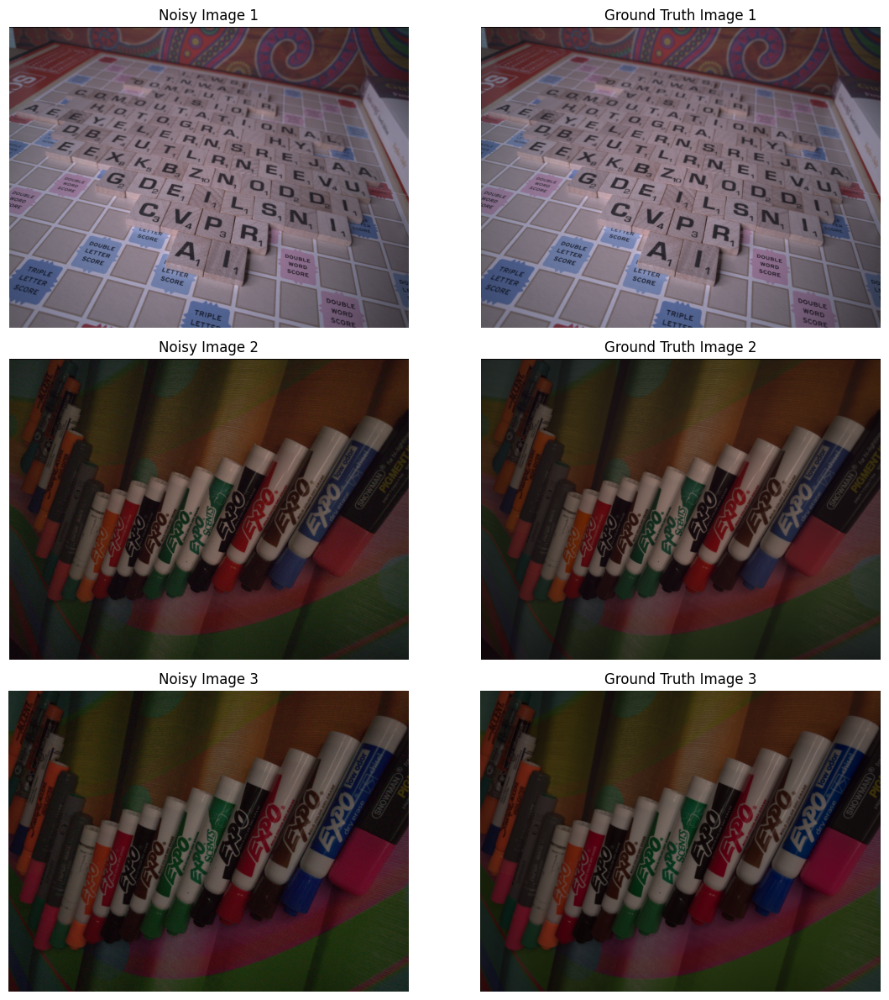

In [10]:
num_samples_to_show = 3
sample_pairs = random.sample(pairs, min(num_samples_to_show, len(pairs)))

plt.figure(figsize=(12, 4 * num_samples_to_show))
for i, (noisy_path, gt_path) in enumerate(sample_pairs):
    noisy_img = load_image_rgb(noisy_path)
    gt_img    = load_image_rgb(gt_path)

    plt.subplot(num_samples_to_show, 2, 2*i + 1)
    plt.imshow(noisy_img); plt.title(f"Noisy Image {i+1}"); plt.axis("off")

    plt.subplot(num_samples_to_show, 2, 2*i + 2)
    plt.imshow(gt_img); plt.title(f"Ground Truth Image {i+1}"); plt.axis("off")

plt.tight_layout()
plt.show()

In [11]:
train_pairs, val_pairs = train_test_split(
    pairs, test_size=0.2, random_state=42, shuffle=True
)

print("Training pairs  :", len(train_pairs))
print("Validation pairs:", len(val_pairs))

split_save_path = "/content/datasets/SIDD_train_val_split.json"
with open(split_save_path, "w") as f:
    json.dump({"train": train_pairs, "val": val_pairs}, f, indent=2)
print("Saved split file to:", split_save_path)

Training pairs  : 256
Validation pairs: 64
Saved split file to: /content/datasets/SIDD_train_val_split.json


## Dataset and augmentation

In [12]:
PATCH_SIZE = 256

def random_crop_pair(noisy, gt, patch_size=256):
    h, w, _ = noisy.shape
    if h < patch_size or w < patch_size:
        raise ValueError(f"Image {(h, w)} smaller than patch {patch_size}")
    top  = np.random.randint(0, h - patch_size + 1)
    left = np.random.randint(0, w - patch_size + 1)
    return (noisy[top:top+patch_size, left:left+patch_size],
            gt[top:top+patch_size,    left:left+patch_size])

In [13]:
def augment_pair(noisy, gt):
    # Horizontal flip
    if random.random() > 0.5:
        noisy = np.fliplr(noisy).copy()
        gt    = np.fliplr(gt).copy()
    # Vertical flip
    if random.random() > 0.5:
        noisy = np.flipud(noisy).copy()
        gt    = np.flipud(gt).copy()
    # 90-degree rotation
    k = random.randint(0, 3)
    noisy = np.rot90(noisy, k).copy()
    gt    = np.rot90(gt,    k).copy()
    return noisy, gt

In [14]:
def image_to_tensor(img):
    return torch.from_numpy(img.transpose(2, 0, 1)).float()


class SIDDDenoisingDataset(Dataset):
    def __init__(self, pairs, patch_size=256, augment=False, use_random_crop=True):
        self.pairs           = pairs
        self.patch_size      = patch_size
        self.augment         = augment
        self.use_random_crop = use_random_crop

    def __len__(self):
        return len(self.pairs)

    def _center_crop(self, noisy, gt):
        h, w, _ = noisy.shape
        p = self.patch_size
        top  = (h - p) // 2
        left = (w - p) // 2
        return noisy[top:top+p, left:left+p], gt[top:top+p, left:left+p]

    def __getitem__(self, idx):
        noisy_path, gt_path = self.pairs[idx]
        noisy = load_image_rgb(noisy_path)
        gt    = load_image_rgb(gt_path)

        if self.patch_size is not None:
            noisy, gt = (random_crop_pair(noisy, gt, self.patch_size)
                         if self.use_random_crop else self._center_crop(noisy, gt))

        if self.augment:
            noisy, gt = augment_pair(noisy, gt)

        return image_to_tensor(noisy), image_to_tensor(gt)

In [15]:
BATCH_SIZE  = 8
NUM_WORKERS = 0

train_dataset = SIDDDenoisingDataset(train_pairs, patch_size=PATCH_SIZE, augment=True,  use_random_crop=True)
val_dataset   = SIDDDenoisingDataset(val_pairs,   patch_size=PATCH_SIZE, augment=False, use_random_crop=False)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

print("Train dataset size  :", len(train_dataset))
print("Val dataset size    :", len(val_dataset))
print("Train loader batches:", len(train_loader))
print("Val loader batches  :", len(val_loader))

Train dataset size  : 256
Val dataset size    : 64
Train loader batches: 32
Val loader batches  : 8


Noisy batch shape : torch.Size([8, 3, 256, 256])
Noisy min/max     : 0.0 1.0


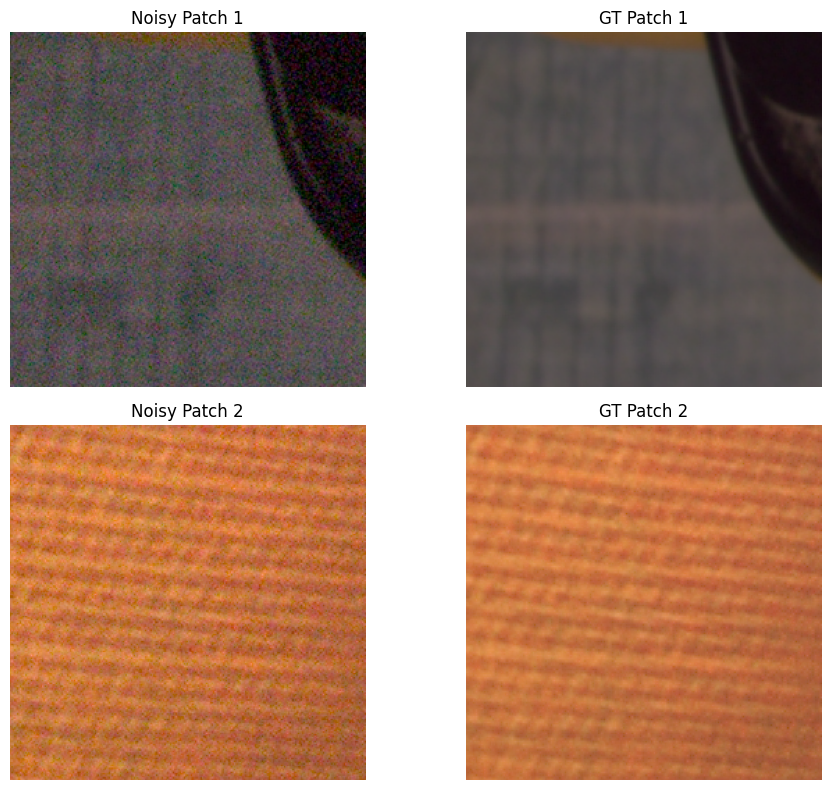

In [16]:
def tensor_to_image(tensor):
    img = tensor.detach().cpu().float().numpy().transpose(1, 2, 0)
    return np.clip(img, 0, 1)


noisy_batch, gt_batch = next(iter(train_loader))
print("Noisy batch shape :", noisy_batch.shape)
print("Noisy min/max     :", noisy_batch.min().item(), noisy_batch.max().item())

num_show = min(2, BATCH_SIZE)
plt.figure(figsize=(10, 4 * num_show))
for i in range(num_show):
    plt.subplot(num_show, 2, 2*i+1)
    plt.imshow(tensor_to_image(noisy_batch[i]))
    plt.title(f"Noisy Patch {i+1}"); plt.axis("off")
    plt.subplot(num_show, 2, 2*i+2)
    plt.imshow(tensor_to_image(gt_batch[i]))
    plt.title(f"GT Patch {i+1}"); plt.axis("off")
plt.tight_layout(); plt.show()

## Preprocessing Visualizations

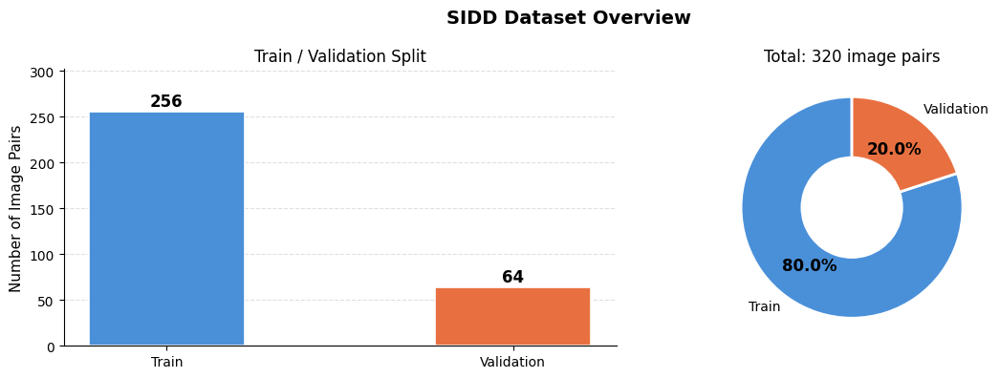

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle("SIDD Dataset Overview", fontsize=14, fontweight="bold")

split_names  = ["Train", "Validation"]
split_counts = [len(train_pairs), len(val_pairs)]
bar_colors   = ["#4A90D9", "#E87040"]

ax = axes[0]
bars = ax.bar(split_names, split_counts, color=bar_colors, width=0.45,
              edgecolor="white", linewidth=1.2)
for bar, val in zip(bars, split_counts):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 2,
            f"{val:,}", ha="center", va="bottom", fontsize=12, fontweight="bold")
ax.set_ylabel("Number of Image Pairs", fontsize=11)
ax.set_title("Train / Validation Split", fontsize=12)
ax.set_ylim(0, max(split_counts) * 1.18)
ax.spines[["top", "right"]].set_visible(False)
ax.yaxis.grid(True, linestyle="--", alpha=0.4)
ax.set_axisbelow(True)

ax2 = axes[1]
wedges, texts, autotexts = ax2.pie(
    split_counts, labels=split_names, colors=bar_colors,
    autopct="%1.1f%%", startangle=90, pctdistance=0.65,
    wedgeprops=dict(width=0.55, edgecolor="white", linewidth=2)
)
for at in autotexts:
    at.set_fontsize(12); at.set_fontweight("bold")
ax2.set_title(f"Total: {sum(split_counts):,} image pairs", fontsize=12)

plt.tight_layout()
plt.show()


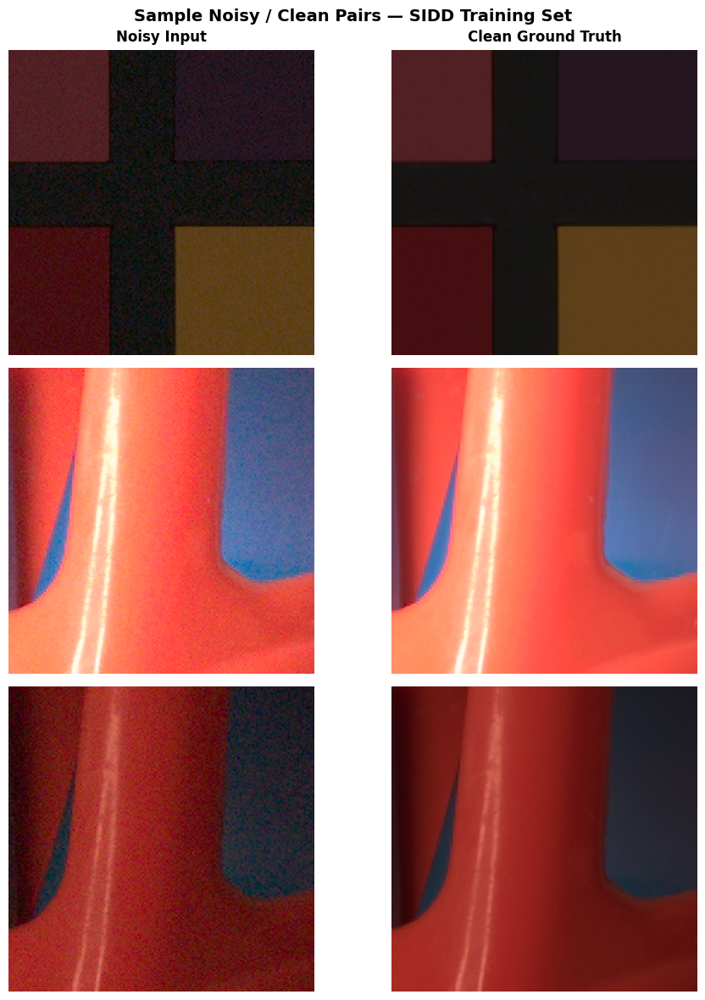

In [18]:
import random as _rnd

_rnd.seed(7)
_sample_idx = _rnd.sample(range(len(train_pairs)), 3)

fig, axes = plt.subplots(3, 2, figsize=(10, 12))
fig.suptitle("Sample Noisy / Clean Pairs — SIDD Training Set",
             fontsize=14, fontweight="bold")
axes[0][0].set_title("Noisy Input",       fontsize=12, fontweight="bold", pad=8)
axes[0][1].set_title("Clean Ground Truth",fontsize=12, fontweight="bold", pad=8)

for row, idx in enumerate(_sample_idx):
    _noisy_path, _gt_path = train_pairs[idx]
    _noisy_img = load_image_rgb(_noisy_path)
    _gt_img    = load_image_rgb(_gt_path)
    _h, _w     = _noisy_img.shape[:2]
    _l = (_w - 256) // 2; _t = (_h - 256) // 2
    _nc = _noisy_img[_t:_t+256, _l:_l+256]
    _gc = _gt_img[_t:_t+256,    _l:_l+256]
    axes[row][0].imshow(_nc); axes[row][0].axis("off")
    axes[row][1].imshow(_gc); axes[row][1].axis("off")
    axes[row][0].set_ylabel(f"Pair {row + 1}", fontsize=10,
                             rotation=0, labelpad=52, va="center")

plt.tight_layout()
plt.show()


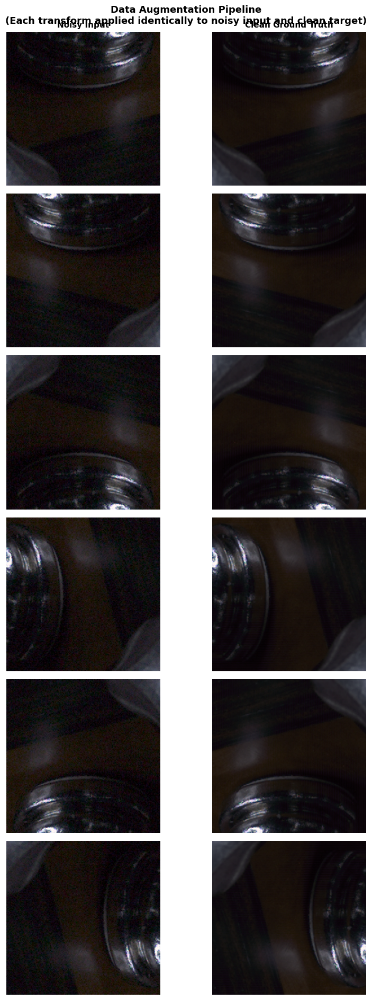

In [19]:
import numpy as np

_noisy_raw, _gt_raw = load_image_rgb(train_pairs[0][0]), load_image_rgb(train_pairs[0][1])
_h, _w = _noisy_raw.shape[:2]
_l = (_w - 256) // 2; _t = (_h - 256) // 2
_bn = _noisy_raw[_t:_t+256, _l:_l+256]
_bg = _gt_raw[_t:_t+256,    _l:_l+256]

_aug_configs = [
    ("Original crop 256x256",   _bn,                                    _bg),
    ("Horizontal flip (p=0.5)", np.fliplr(_bn).copy(),                  np.fliplr(_bg).copy()),
    ("Vertical flip (p=0.5)",   np.flipud(_bn).copy(),                  np.flipud(_bg).copy()),
    ("90-degree rotation",      np.rot90(_bn, 1).copy(),                np.rot90(_bg, 1).copy()),
    ("180-degree rotation",     np.rot90(_bn, 2).copy(),                np.rot90(_bg, 2).copy()),
    ("270-degree rotation",     np.rot90(_bn, 3).copy(),                np.rot90(_bg, 3).copy()),
]

fig, axes = plt.subplots(len(_aug_configs), 2, figsize=(9, 3.2 * len(_aug_configs)))
fig.suptitle("Data Augmentation Pipeline\n"
             "(Each transform applied identically to noisy input and clean target)",
             fontsize=13, fontweight="bold")

for row, (label, aug_n, aug_g) in enumerate(_aug_configs):
    axes[row][0].imshow(aug_n); axes[row][0].axis("off")
    axes[row][1].imshow(aug_g); axes[row][1].axis("off")
    axes[row][0].set_ylabel(label, fontsize=9, rotation=0, labelpad=95, va="center")
    if row == 0:
        axes[row][0].set_title("Noisy Input",        fontsize=11, fontweight="bold")
        axes[row][1].set_title("Clean Ground Truth", fontsize=11, fontweight="bold")

plt.tight_layout()
plt.show()


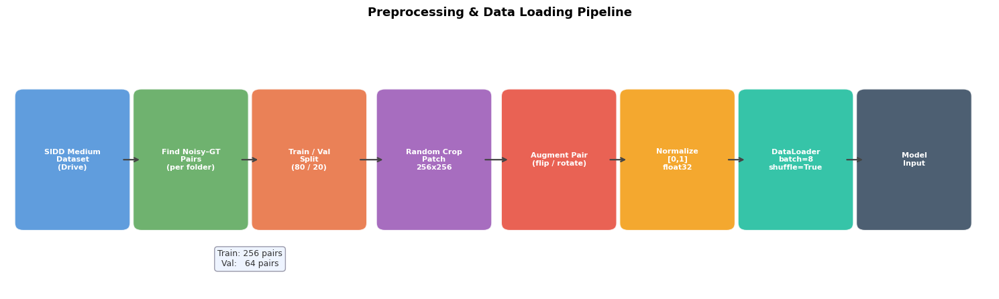

In [20]:
import matplotlib.patches as mpatches

fig, ax = plt.subplots(figsize=(15, 4.5))
ax.set_xlim(0, 15); ax.set_ylim(0, 4.5); ax.axis("off")
fig.suptitle("Preprocessing & Data Loading Pipeline",
             fontsize=13, fontweight="bold")

_steps = [
    ("SIDD Medium\nDataset\n(Drive)",         1.0,  "#4A90D9"),
    ("Find Noisy–GT\nPairs\n(per folder)",    2.8,  "#5BA85B"),
    ("Train / Val\nSplit\n(80 / 20)",         4.6,  "#E87040"),
    ("Random Crop\nPatch\n256x256",           6.5,  "#9B59B6"),
    ("Augment Pair\n(flip / rotate)",          8.4,  "#E74C3C"),
    ("Normalize\n[0,1]\nfloat32",            10.2,  "#F39C12"),
    ("DataLoader\nbatch=8\nshuffle=True",    12.0,  "#1ABC9C"),
    ("Model\nInput",                          13.8,  "#34495E"),
]

_bw = 1.5; _bh = 2.2; _ym = 2.3
for _label, _xc, _color in _steps:
    _rect = mpatches.FancyBboxPatch(
        (_xc - _bw / 2, _ym - _bh / 2), _bw, _bh,
        boxstyle="round,pad=0.13", linewidth=1.5,
        edgecolor="white", facecolor=_color, alpha=0.88
    )
    ax.add_patch(_rect)
    ax.text(_xc, _ym, _label, ha="center", va="center",
            fontsize=8, fontweight="bold", color="white", multialignment="center")

for _i in range(len(_steps) - 1):
    _x0 = _steps[_i][1]     + _bw / 2
    _x1 = _steps[_i + 1][1] - _bw / 2
    ax.annotate("", xy=(_x1, _ym), xytext=(_x0, _ym),
                arrowprops=dict(arrowstyle="->", color="#444", lw=1.6))

ax.text(3.7, 0.45,
        f"Train: {len(train_pairs):,} pairs\nVal:   {len(val_pairs):,} pairs",
        fontsize=9, color="#333", ha="center",
        bbox=dict(fc="#EEF4FF", ec="#99A", boxstyle="round,pad=0.35"))

plt.tight_layout()
plt.show()


## Metrics

In [21]:
try:
    from torchmetrics.functional import structural_similarity_index_measure
    print("torchmetrics already available.")
except ImportError:
    import subprocess
    subprocess.run(["pip", "install", "-q", "torchmetrics"], check=True)
    from torchmetrics.functional import structural_similarity_index_measure
    print("torchmetrics installed successfully.")


def calculate_psnr_torch(pred, target, max_val=1.0):
    pred   = pred.float()
    target = target.float()
    mse = F.mse_loss(pred, target)
    if mse.item() == 0:
        return 100.0
    return (20 * torch.log10(torch.tensor(max_val)) - 10 * torch.log10(mse)).item()


def calculate_ssim_torch(pred, target):
    return structural_similarity_index_measure(
        pred.float(), target.float(), data_range=1.0
    ).item()

torchmetrics already available.


In [22]:
class ImprovedResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False)
        self.norm1 = nn.BatchNorm2d(channels)
        self.act   = nn.LeakyReLU(0.2, inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1, bias=False)
        self.norm2 = nn.BatchNorm2d(channels)

    def forward(self, x):
        out = self.act(self.norm1(self.conv1(x)))
        out = self.norm2(self.conv2(out))
        return out + x

In [23]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=8):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc   = nn.Sequential(
            nn.Linear(channels, max(channels // reduction, 4)),
            nn.ReLU(inplace=True),
            nn.Linear(max(channels // reduction, 4), channels),
            nn.Sigmoid()
        )

    def forward(self, x):
        w = self.pool(x).flatten(1)
        w = self.fc(w).view(-1, x.size(1), 1, 1)
        return x * w

In [24]:
class LightweightResidualDenoiser(nn.Module):
    def __init__(self, in_channels=3, features=48, num_blocks=8):
        super().__init__()

        self.entry = nn.Sequential(
            nn.Conv2d(in_channels, features, kernel_size=3, padding=1, bias=True),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.res_blocks = nn.Sequential(
            *[ImprovedResidualBlock(features) for _ in range(num_blocks)]
        )

        self.attention = SEBlock(features, reduction=8)

        self.feature_fusion = nn.Conv2d(features, features, kernel_size=3, padding=1, bias=True)

        self.exit = nn.Conv2d(features, in_channels, kernel_size=3, padding=1, bias=True)

        nn.init.zeros_(self.exit.weight)
        nn.init.zeros_(self.exit.bias)

    def forward(self, x):
        feat = self.entry(x)
        feat = self.res_blocks(feat)
        feat = self.attention(feat)
        feat = self.feature_fusion(feat)
        predicted_noise = self.exit(feat)

        return torch.clamp(x - predicted_noise, 0.0, 1.0)

In [25]:
model = LightweightResidualDenoiser(
    in_channels=3,
    features=48,
    num_blocks=8
).to(device)

with torch.no_grad():
    _x  = torch.randn(1, 3, 256, 256).to(device)
    _y  = model(_x)
print("Input shape :", _x.shape)
print("Output shape:", _y.shape)

num_params     = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable parameters: {num_params:,}  ({num_params/1e6:.3f} M)")

Input shape : torch.Size([1, 3, 256, 256])
Output shape: torch.Size([1, 3, 256, 256])
Trainable parameters: 357,369  (0.357 M)


## Loss function

In [26]:
class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3):
        super().__init__()
        self.eps = eps

    def forward(self, pred, target):
        diff = pred.float() - target.float()
        return torch.sqrt(diff * diff + self.eps ** 2).mean()


#Edge loss
def gradient_map(x):
    gx = torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1])
    gy = torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])
    gx = F.pad(gx, (0, 1, 0, 0))
    gy = F.pad(gy, (0, 0, 0, 1))
    return gx + gy


def edge_loss(pred, target):
    return F.l1_loss(gradient_map(pred.float()), gradient_map(target.float()))


#Colour consistency loss
def colour_loss(pred, target):
    pred_mean   = pred.float().mean(dim=[2, 3])
    target_mean = target.float().mean(dim=[2, 3])
    return F.l1_loss(pred_mean, target_mean)


class CombinedDenoisingLoss(nn.Module):
    def __init__(self, alpha=0.65, beta=0.20, gamma=0.10, delta=0.05):
        super().__init__()
        self.alpha = alpha
        self.beta  = beta
        self.gamma = gamma
        self.delta = delta
        self.charb = CharbonnierLoss()

    def forward(self, pred, target):
        loss_charb   = self.charb(pred, target)
        ssim_val     = structural_similarity_index_measure(
                           pred.float(), target.float(), data_range=1.0)
        loss_ssim    = 1.0 - ssim_val
        loss_edge    = edge_loss(pred, target)
        loss_colour  = colour_loss(pred, target)

        total = (self.alpha * loss_charb
               + self.beta  * loss_ssim
               + self.gamma * loss_edge
               + self.delta * loss_colour)
        return total, loss_charb.detach(), loss_ssim.detach(), loss_edge.detach()


criterion = CombinedDenoisingLoss(alpha=0.65, beta=0.20, gamma=0.10, delta=0.05)
print("Loss: 0.65 × Charbonnier  +  0.20 × SSIM  +  0.10 × Edge  +  0.05 × Colour")

Loss: 0.65 × Charbonnier  +  0.20 × SSIM  +  0.10 × Edge  +  0.05 × Colour


## Optimizer, scheduler, and AMP

In [27]:
LEARNING_RATE = 2e-4
WEIGHT_DECAY  = 1e-4

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

NUM_EPOCHS = 100
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=30,
    T_mult=2,
    eta_min=1e-6
)

scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())

print(f"Optimizer  : AdamW  lr={LEARNING_RATE}  wd={WEIGHT_DECAY}")
print(f"Scheduler  : CosineAnnealingWarmRestarts  T_0=30  T_mult=2")
print(f"AMP scaler : {'enabled' if torch.cuda.is_available() else 'disabled (CPU)'}")
print(f"Epochs     : {NUM_EPOCHS}")

Optimizer  : AdamW  lr=0.0002  wd=0.0001
Scheduler  : CosineAnnealingWarmRestarts  T_0=30  T_mult=2
AMP scaler : enabled
Epochs     : 100


/tmp/ipykernel_86130/2939121556.py:18: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())


In [28]:
model.eval()
with torch.no_grad():
    nb, gb = next(iter(val_loader))
    nb, gb = nb.to(device), gb.to(device)
    out = model(nb)

pre_psnr = calculate_psnr_torch(out, gb)
pre_ssim = calculate_ssim_torch(out, gb)
print(f"PSNR before training : {pre_psnr:.4f} dB")
print(f"SSIM before training : {pre_ssim:.4f}")
print("(Should be close to input PSNR since exit weights are zero-initialised)")

PSNR before training : 23.6027 dB
SSIM before training : 0.4943
(Should be close to input PSNR since exit weights are zero-initialised)


/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(


## Training loop

In [29]:
def train_one_epoch(model, loader, criterion, optimizer, scaler, device):
    model.train()

    running_total = running_charb = running_ssim = running_edge = 0.0
    pbar = tqdm(loader, desc="Training", leave=False)

    for noisy, gt in pbar:
        noisy = noisy.to(device, non_blocking=True)
        gt    = gt.to(device,    non_blocking=True)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            output = model(noisy)
            total_loss, charb_loss, ssim_loss, edge_l = criterion(output, gt)

        scaler.scale(total_loss).backward()

        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        scaler.step(optimizer)
        scaler.update()

        running_total += total_loss.item()
        running_charb += charb_loss.item()
        running_ssim  += ssim_loss.item()
        running_edge  += edge_l.item()

        pbar.set_postfix(
            total=f"{total_loss.item():.4f}",
            charb=f"{charb_loss.item():.4f}",
            ssim=f"{ssim_loss.item():.4f}"
        )

    n = len(loader)
    return {
        "total_loss" : running_total / n,
        "charb_loss" : running_charb / n,
        "ssim_loss"  : running_ssim  / n,
        "edge_loss"  : running_edge  / n
    }

In [30]:
@torch.no_grad()
def validate_one_epoch(model, loader, criterion, device):
    model.eval()

    running_total = running_charb = running_ssim = running_edge = 0.0
    running_psnr  = running_ssim_metric = 0.0
    pbar = tqdm(loader, desc="Validation", leave=False)

    for noisy, gt in pbar:
        noisy = noisy.to(device, non_blocking=True)
        gt    = gt.to(device,    non_blocking=True)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            output = model(noisy)
            total_loss, charb_loss, ssim_loss, edge_l = criterion(output, gt)

        running_total += total_loss.item()
        running_charb += charb_loss.item()
        running_ssim  += ssim_loss.item()
        running_edge  += edge_l.item()
        running_psnr         += calculate_psnr_torch(output.float(), gt.float())
        running_ssim_metric  += calculate_ssim_torch(output.float(), gt.float())

        pbar.set_postfix(total=f"{total_loss.item():.4f}")

    n = len(loader)
    return {
        "total_loss"  : running_total        / n,
        "charb_loss"  : running_charb        / n,
        "ssim_loss"   : running_ssim         / n,
        "edge_loss"   : running_edge         / n,
        "psnr"        : running_psnr         / n,
        "ssim"        : running_ssim_metric  / n
    }

In [31]:
checkpoint_dir  = "/content/checkpoints_denoising_proposed"
os.makedirs(checkpoint_dir, exist_ok=True)

best_model_path = os.path.join(checkpoint_dir, "proposed_denoiser_best.pth")
last_model_path = os.path.join(checkpoint_dir, "proposed_denoiser_last.pth")

print("Checkpoint directory:", checkpoint_dir)
print("Best model path     :", best_model_path)
print("Last model path     :", last_model_path)

Checkpoint directory: /content/checkpoints_denoising_proposed
Best model path     : /content/checkpoints_denoising_proposed/proposed_denoiser_best.pth
Last model path     : /content/checkpoints_denoising_proposed/proposed_denoiser_last.pth


In [32]:
history = {
    "train_total_loss" : [], "train_charb_loss" : [],
    "train_ssim_loss"  : [], "train_edge_loss"  : [],
    "val_total_loss"   : [], "val_charb_loss"   : [],
    "val_ssim_loss"    : [], "val_edge_loss"    : [],
    "val_psnr"         : [], "val_ssim"         : []
}
best_val_psnr = -float("inf")

In [33]:
for epoch in range(1, NUM_EPOCHS + 1):
    print(f"\nEpoch [{epoch}/{NUM_EPOCHS}]")
    print("-" * 55)

    train_m = train_one_epoch(model, train_loader, criterion, optimizer, scaler, device)
    val_m   = validate_one_epoch(model, val_loader, criterion, device)

    scheduler.step()

    history["train_total_loss"].append(train_m["total_loss"])
    history["train_charb_loss"].append(train_m["charb_loss"])
    history["train_ssim_loss"].append(train_m["ssim_loss"])
    history["train_edge_loss"].append(train_m["edge_loss"])
    history["val_total_loss"].append(val_m["total_loss"])
    history["val_charb_loss"].append(val_m["charb_loss"])
    history["val_ssim_loss"].append(val_m["ssim_loss"])
    history["val_edge_loss"].append(val_m["edge_loss"])
    history["val_psnr"].append(val_m["psnr"])
    history["val_ssim"].append(val_m["ssim"])

    print(f"Train Total Loss : {train_m['total_loss']:.6f}")
    print(f"Train Charb Loss : {train_m['charb_loss']:.6f}")
    print(f"Train SSIM Loss  : {train_m['ssim_loss']:.6f}")
    print(f"Train Edge Loss  : {train_m['edge_loss']:.6f}")
    print(f"Val Total Loss   : {val_m['total_loss']:.6f}")
    print(f"Val PSNR         : {val_m['psnr']:.4f} dB")
    print(f"Val SSIM         : {val_m['ssim']:.4f}")
    print(f"Current LR       : {optimizer.param_groups[0]['lr']:.2e}")

    torch.save({
        "epoch"               : epoch,
        "model_state_dict"    : model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "scheduler_state_dict": scheduler.state_dict(),
        "scaler_state_dict"   : scaler.state_dict(),
        "history"             : history
    }, last_model_path)

    if val_m["psnr"] > best_val_psnr:
        best_val_psnr = val_m["psnr"]
        torch.save({
            "epoch"            : epoch,
            "best_psnr"        : best_val_psnr,
            "model_state_dict" : model.state_dict(),
            "history"          : history
        }, best_model_path)
        print(f"  Best model updated — PSNR {best_val_psnr:.4f} dB")


Epoch [1/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

/tmp/ipykernel_86130/4051736573.py:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.092719
Train Charb Loss : 0.025836
Train SSIM Loss  : 0.358357
Train Edge Loss  : 0.038478
Val Total Loss   : 0.114732
Val PSNR         : 26.0173 dB
Val SSIM         : 0.5983
Current LR       : 1.99e-04
  Best model updated — PSNR 26.0173 dB

Epoch [2/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.070170
Train Charb Loss : 0.018955
Train SSIM Loss  : 0.275571
Train Edge Loss  : 0.024576
Val Total Loss   : 0.070687
Val PSNR         : 30.3109 dB
Val SSIM         : 0.7712
Current LR       : 1.98e-04
  Best model updated — PSNR 30.3109 dB

Epoch [3/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.058557
Train Charb Loss : 0.016746
Train SSIM Loss  : 0.227450
Train Edge Loss  : 0.019149
Val Total Loss   : 0.056658
Val PSNR         : 31.6013 dB
Val SSIM         : 0.8313
Current LR       : 1.95e-04
  Best model updated — PSNR 31.6013 dB

Epoch [4/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.057951
Train Charb Loss : 0.016405
Train SSIM Loss  : 0.226115
Train Edge Loss  : 0.018215
Val Total Loss   : 0.054683
Val PSNR         : 31.6935 dB
Val SSIM         : 0.8412
Current LR       : 1.91e-04
  Best model updated — PSNR 31.6935 dB

Epoch [5/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.054176
Train Charb Loss : 0.016008
Train SSIM Loss  : 0.209306
Train Edge Loss  : 0.016390
Val Total Loss   : 0.051967
Val PSNR         : 31.6512 dB
Val SSIM         : 0.8572
Current LR       : 1.87e-04

Epoch [6/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.058531
Train Charb Loss : 0.016486
Train SSIM Loss  : 0.229153
Train Edge Loss  : 0.017385
Val Total Loss   : 0.049183
Val PSNR         : 32.3796 dB
Val SSIM         : 0.8634
Current LR       : 1.81e-04
  Best model updated — PSNR 32.3796 dB

Epoch [7/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.051203
Train Charb Loss : 0.015087
Train SSIM Loss  : 0.198429
Train Edge Loss  : 0.014822
Val Total Loss   : 0.054480
Val PSNR         : 32.0844 dB
Val SSIM         : 0.8397
Current LR       : 1.74e-04

Epoch [8/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.051608
Train Charb Loss : 0.015072
Train SSIM Loss  : 0.200469
Train Edge Loss  : 0.014672
Val Total Loss   : 0.047344
Val PSNR         : 32.4950 dB
Val SSIM         : 0.8727
Current LR       : 1.67e-04
  Best model updated — PSNR 32.4950 dB

Epoch [9/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.057662
Train Charb Loss : 0.016013
Train SSIM Loss  : 0.226609
Train Edge Loss  : 0.017079
Val Total Loss   : 0.047562
Val PSNR         : 32.5338 dB
Val SSIM         : 0.8705
Current LR       : 1.59e-04
  Best model updated — PSNR 32.5338 dB

Epoch [10/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.050758
Train Charb Loss : 0.014594
Train SSIM Loss  : 0.198269
Train Edge Loss  : 0.013549
Val Total Loss   : 0.050824
Val PSNR         : 31.1193 dB
Val SSIM         : 0.8679
Current LR       : 1.50e-04

Epoch [11/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.047453
Train Charb Loss : 0.014363
Train SSIM Loss  : 0.182989
Train Edge Loss  : 0.012876
Val Total Loss   : 0.044489
Val PSNR         : 33.2256 dB
Val SSIM         : 0.8827
Current LR       : 1.41e-04
  Best model updated — PSNR 33.2256 dB

Epoch [12/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.049276
Train Charb Loss : 0.014096
Train SSIM Loss  : 0.192895
Train Edge Loss  : 0.013134
Val Total Loss   : 0.043314
Val PSNR         : 33.2877 dB
Val SSIM         : 0.8879
Current LR       : 1.31e-04
  Best model updated — PSNR 33.2877 dB

Epoch [13/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.045198
Train Charb Loss : 0.013662
Train SSIM Loss  : 0.174452
Train Edge Loss  : 0.012152
Val Total Loss   : 0.043090
Val PSNR         : 33.2548 dB
Val SSIM         : 0.8887
Current LR       : 1.21e-04

Epoch [14/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.043492
Train Charb Loss : 0.013173
Train SSIM Loss  : 0.167843
Train Edge Loss  : 0.011616
Val Total Loss   : 0.043265
Val PSNR         : 32.8383 dB
Val SSIM         : 0.8896
Current LR       : 1.11e-04

Epoch [15/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.045032
Train Charb Loss : 0.013468
Train SSIM Loss  : 0.174446
Train Edge Loss  : 0.011825
Val Total Loss   : 0.047144
Val PSNR         : 32.7125 dB
Val SSIM         : 0.8716
Current LR       : 1.01e-04

Epoch [16/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.045897
Train Charb Loss : 0.013318
Train SSIM Loss  : 0.179347
Train Edge Loss  : 0.011582
Val Total Loss   : 0.044973
Val PSNR         : 33.1593 dB
Val SSIM         : 0.8797
Current LR       : 9.01e-05

Epoch [17/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042565
Train Charb Loss : 0.013089
Train SSIM Loss  : 0.163647
Train Edge Loss  : 0.011322
Val Total Loss   : 0.043426
Val PSNR         : 33.2375 dB
Val SSIM         : 0.8869
Current LR       : 7.98e-05

Epoch [18/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.044860
Train Charb Loss : 0.013528
Train SSIM Loss  : 0.173321
Train Edge Loss  : 0.011974
Val Total Loss   : 0.046588
Val PSNR         : 33.0358 dB
Val SSIM         : 0.8721
Current LR       : 6.98e-05

Epoch [19/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.044003
Train Charb Loss : 0.013491
Train SSIM Loss  : 0.169191
Train Edge Loss  : 0.011831
Val Total Loss   : 0.041247
Val PSNR         : 33.3803 dB
Val SSIM         : 0.8975
Current LR       : 6.00e-05
  Best model updated — PSNR 33.3803 dB

Epoch [20/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042737
Train Charb Loss : 0.012892
Train SSIM Loss  : 0.165267
Train Edge Loss  : 0.011079
Val Total Loss   : 0.045935
Val PSNR         : 32.9483 dB
Val SSIM         : 0.8765
Current LR       : 5.08e-05

Epoch [21/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042924
Train Charb Loss : 0.012828
Train SSIM Loss  : 0.166361
Train Edge Loss  : 0.011138
Val Total Loss   : 0.041351
Val PSNR         : 33.2828 dB
Val SSIM         : 0.8977
Current LR       : 4.20e-05

Epoch [22/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041372
Train Charb Loss : 0.012559
Train SSIM Loss  : 0.159918
Train Edge Loss  : 0.010217
Val Total Loss   : 0.041532
Val PSNR         : 33.3225 dB
Val SSIM         : 0.8966
Current LR       : 3.39e-05

Epoch [23/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039514
Train Charb Loss : 0.012452
Train SSIM Loss  : 0.151054
Train Edge Loss  : 0.010134
Val Total Loss   : 0.041119
Val PSNR         : 33.4446 dB
Val SSIM         : 0.8975
Current LR       : 2.66e-05
  Best model updated — PSNR 33.4446 dB

Epoch [24/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041443
Train Charb Loss : 0.012489
Train SSIM Loss  : 0.160535
Train Edge Loss  : 0.010321
Val Total Loss   : 0.040936
Val PSNR         : 33.5283 dB
Val SSIM         : 0.8981
Current LR       : 2.00e-05
  Best model updated — PSNR 33.5283 dB

Epoch [25/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042459
Train Charb Loss : 0.012757
Train SSIM Loss  : 0.164405
Train Edge Loss  : 0.010927
Val Total Loss   : 0.042256
Val PSNR         : 33.3777 dB
Val SSIM         : 0.8926
Current LR       : 1.43e-05

Epoch [26/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040221
Train Charb Loss : 0.012292
Train SSIM Loss  : 0.155150
Train Edge Loss  : 0.010105
Val Total Loss   : 0.041502
Val PSNR         : 33.5282 dB
Val SSIM         : 0.8951
Current LR       : 9.60e-06

Epoch [27/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038813
Train Charb Loss : 0.012029
Train SSIM Loss  : 0.149177
Train Edge Loss  : 0.009940
Val Total Loss   : 0.041098
Val PSNR         : 33.6131 dB
Val SSIM         : 0.8970
Current LR       : 5.87e-06
  Best model updated — PSNR 33.6131 dB

Epoch [28/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039418
Train Charb Loss : 0.012185
Train SSIM Loss  : 0.151599
Train Edge Loss  : 0.009940
Val Total Loss   : 0.040560
Val PSNR         : 33.6333 dB
Val SSIM         : 0.8993
Current LR       : 3.17e-06
  Best model updated — PSNR 33.6333 dB

Epoch [29/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039684
Train Charb Loss : 0.012346
Train SSIM Loss  : 0.152222
Train Edge Loss  : 0.010229
Val Total Loss   : 0.040382
Val PSNR         : 33.5669 dB
Val SSIM         : 0.9008
Current LR       : 1.55e-06

Epoch [30/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041474
Train Charb Loss : 0.012475
Train SSIM Loss  : 0.160602
Train Edge Loss  : 0.010576
Val Total Loss   : 0.041367
Val PSNR         : 33.5122 dB
Val SSIM         : 0.8957
Current LR       : 2.00e-04

Epoch [31/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.043311
Train Charb Loss : 0.013247
Train SSIM Loss  : 0.166794
Train Edge Loss  : 0.011402
Val Total Loss   : 0.044799
Val PSNR         : 32.8046 dB
Val SSIM         : 0.8822
Current LR       : 2.00e-04

Epoch [32/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.046614
Train Charb Loss : 0.013920
Train SSIM Loss  : 0.180520
Train Edge Loss  : 0.012224
Val Total Loss   : 0.042884
Val PSNR         : 32.8511 dB
Val SSIM         : 0.8924
Current LR       : 1.99e-04

Epoch [33/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.046372
Train Charb Loss : 0.014088
Train SSIM Loss  : 0.178946
Train Edge Loss  : 0.011780
Val Total Loss   : 0.043055
Val PSNR         : 33.0562 dB
Val SSIM         : 0.8913
Current LR       : 1.99e-04

Epoch [34/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.044431
Train Charb Loss : 0.013555
Train SSIM Loss  : 0.171338
Train Edge Loss  : 0.011147
Val Total Loss   : 0.044984
Val PSNR         : 33.1573 dB
Val SSIM         : 0.8789
Current LR       : 1.98e-04

Epoch [35/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042668
Train Charb Loss : 0.013246
Train SSIM Loss  : 0.163750
Train Edge Loss  : 0.010768
Val Total Loss   : 0.042151
Val PSNR         : 33.3128 dB
Val SSIM         : 0.8942
Current LR       : 1.97e-04

Epoch [36/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042103
Train Charb Loss : 0.012988
Train SSIM Loss  : 0.161763
Train Edge Loss  : 0.010954
Val Total Loss   : 0.043589
Val PSNR         : 32.4469 dB
Val SSIM         : 0.8917
Current LR       : 1.95e-04

Epoch [37/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041158
Train Charb Loss : 0.012793
Train SSIM Loss  : 0.157895
Train Edge Loss  : 0.010507
Val Total Loss   : 0.041498
Val PSNR         : 33.0166 dB
Val SSIM         : 0.8999
Current LR       : 1.93e-04

Epoch [38/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041964
Train Charb Loss : 0.012770
Train SSIM Loss  : 0.161954
Train Edge Loss  : 0.010591
Val Total Loss   : 0.042618
Val PSNR         : 33.3144 dB
Val SSIM         : 0.8920
Current LR       : 1.91e-04

Epoch [39/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042032
Train Charb Loss : 0.013276
Train SSIM Loss  : 0.160345
Train Edge Loss  : 0.011006
Val Total Loss   : 0.041784
Val PSNR         : 33.1122 dB
Val SSIM         : 0.8964
Current LR       : 1.89e-04

Epoch [40/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042372
Train Charb Loss : 0.012910
Train SSIM Loss  : 0.163467
Train Edge Loss  : 0.010585
Val Total Loss   : 0.039907
Val PSNR         : 33.5722 dB
Val SSIM         : 0.9040
Current LR       : 1.87e-04

Epoch [41/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.043353
Train Charb Loss : 0.012922
Train SSIM Loss  : 0.168134
Train Edge Loss  : 0.011223
Val Total Loss   : 0.044629
Val PSNR         : 33.0256 dB
Val SSIM         : 0.8828
Current LR       : 1.84e-04

Epoch [42/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.042202
Train Charb Loss : 0.012921
Train SSIM Loss  : 0.162539
Train Edge Loss  : 0.010960
Val Total Loss   : 0.039424
Val PSNR         : 33.7614 dB
Val SSIM         : 0.9057
Current LR       : 1.81e-04
  Best model updated — PSNR 33.7614 dB

Epoch [43/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040348
Train Charb Loss : 0.012484
Train SSIM Loss  : 0.155107
Train Edge Loss  : 0.009966
Val Total Loss   : 0.041286
Val PSNR         : 33.6362 dB
Val SSIM         : 0.8954
Current LR       : 1.78e-04

Epoch [44/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040585
Train Charb Loss : 0.012504
Train SSIM Loss  : 0.156192
Train Edge Loss  : 0.010080
Val Total Loss   : 0.040085
Val PSNR         : 33.5236 dB
Val SSIM         : 0.9027
Current LR       : 1.74e-04

Epoch [45/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040461
Train Charb Loss : 0.012422
Train SSIM Loss  : 0.155957
Train Edge Loss  : 0.009898
Val Total Loss   : 0.042246
Val PSNR         : 33.3360 dB
Val SSIM         : 0.8943
Current LR       : 1.71e-04

Epoch [46/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039118
Train Charb Loss : 0.012298
Train SSIM Loss  : 0.149752
Train Edge Loss  : 0.009786
Val Total Loss   : 0.048681
Val PSNR         : 32.5924 dB
Val SSIM         : 0.8628
Current LR       : 1.67e-04

Epoch [47/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038994
Train Charb Loss : 0.012153
Train SSIM Loss  : 0.149649
Train Edge Loss  : 0.009635
Val Total Loss   : 0.038485
Val PSNR         : 33.9723 dB
Val SSIM         : 0.9096
Current LR       : 1.63e-04
  Best model updated — PSNR 33.9723 dB

Epoch [48/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040475
Train Charb Loss : 0.012388
Train SSIM Loss  : 0.156139
Train Edge Loss  : 0.010003
Val Total Loss   : 0.038281
Val PSNR         : 33.8397 dB
Val SSIM         : 0.9116
Current LR       : 1.59e-04

Epoch [49/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039639
Train Charb Loss : 0.012304
Train SSIM Loss  : 0.152229
Train Edge Loss  : 0.009976
Val Total Loss   : 0.039678
Val PSNR         : 33.9340 dB
Val SSIM         : 0.9022
Current LR       : 1.55e-04

Epoch [50/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039718
Train Charb Loss : 0.012157
Train SSIM Loss  : 0.153141
Train Edge Loss  : 0.009842
Val Total Loss   : 0.038795
Val PSNR         : 33.7652 dB
Val SSIM         : 0.9094
Current LR       : 1.50e-04

Epoch [51/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038385
Train Charb Loss : 0.011851
Train SSIM Loss  : 0.147713
Train Edge Loss  : 0.009396
Val Total Loss   : 0.039562
Val PSNR         : 33.8995 dB
Val SSIM         : 0.9031
Current LR       : 1.46e-04

Epoch [52/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038629
Train Charb Loss : 0.012023
Train SSIM Loss  : 0.148366
Train Edge Loss  : 0.009488
Val Total Loss   : 0.039848
Val PSNR         : 33.9609 dB
Val SSIM         : 0.9010
Current LR       : 1.41e-04

Epoch [53/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036652
Train Charb Loss : 0.011624
Train SSIM Loss  : 0.139976
Train Edge Loss  : 0.009058
Val Total Loss   : 0.038674
Val PSNR         : 34.1891 dB
Val SSIM         : 0.9066
Current LR       : 1.36e-04
  Best model updated — PSNR 34.1891 dB

Epoch [54/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037827
Train Charb Loss : 0.011893
Train SSIM Loss  : 0.144905
Train Edge Loss  : 0.009364
Val Total Loss   : 0.037383
Val PSNR         : 34.1646 dB
Val SSIM         : 0.9139
Current LR       : 1.31e-04

Epoch [55/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.040178
Train Charb Loss : 0.012108
Train SSIM Loss  : 0.155655
Train Edge Loss  : 0.009792
Val Total Loss   : 0.039084
Val PSNR         : 33.9405 dB
Val SSIM         : 0.9067
Current LR       : 1.26e-04

Epoch [56/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037300
Train Charb Loss : 0.011517
Train SSIM Loss  : 0.143556
Train Edge Loss  : 0.009080
Val Total Loss   : 0.037647
Val PSNR         : 34.1249 dB
Val SSIM         : 0.9137
Current LR       : 1.21e-04

Epoch [57/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037055
Train Charb Loss : 0.011706
Train SSIM Loss  : 0.141585
Train Edge Loss  : 0.009373
Val Total Loss   : 0.037183
Val PSNR         : 34.2751 dB
Val SSIM         : 0.9147
Current LR       : 1.16e-04
  Best model updated — PSNR 34.2751 dB

Epoch [58/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.039847
Train Charb Loss : 0.011999
Train SSIM Loss  : 0.154411
Train Edge Loss  : 0.009811
Val Total Loss   : 0.040036
Val PSNR         : 33.7247 dB
Val SSIM         : 0.9029
Current LR       : 1.11e-04

Epoch [59/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038262
Train Charb Loss : 0.011833
Train SSIM Loss  : 0.147277
Train Edge Loss  : 0.009333
Val Total Loss   : 0.039725
Val PSNR         : 34.0918 dB
Val SSIM         : 0.9017
Current LR       : 1.06e-04

Epoch [60/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036144
Train Charb Loss : 0.011497
Train SSIM Loss  : 0.137960
Train Edge Loss  : 0.008979
Val Total Loss   : 0.038206
Val PSNR         : 33.8266 dB
Val SSIM         : 0.9130
Current LR       : 1.01e-04

Epoch [61/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037606
Train Charb Loss : 0.011643
Train SSIM Loss  : 0.144714
Train Edge Loss  : 0.009056
Val Total Loss   : 0.036932
Val PSNR         : 34.1878 dB
Val SSIM         : 0.9171
Current LR       : 9.53e-05

Epoch [62/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037042
Train Charb Loss : 0.011724
Train SSIM Loss  : 0.141520
Train Edge Loss  : 0.009387
Val Total Loss   : 0.038073
Val PSNR         : 34.0968 dB
Val SSIM         : 0.9110
Current LR       : 9.01e-05

Epoch [63/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036272
Train Charb Loss : 0.011234
Train SSIM Loss  : 0.139655
Train Edge Loss  : 0.008572
Val Total Loss   : 0.036898
Val PSNR         : 34.2792 dB
Val SSIM         : 0.9160
Current LR       : 8.49e-05
  Best model updated — PSNR 34.2792 dB

Epoch [64/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036266
Train Charb Loss : 0.011586
Train SSIM Loss  : 0.138159
Train Edge Loss  : 0.009040
Val Total Loss   : 0.036739
Val PSNR         : 34.2331 dB
Val SSIM         : 0.9177
Current LR       : 7.98e-05

Epoch [65/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038963
Train Charb Loss : 0.011892
Train SSIM Loss  : 0.150477
Train Edge Loss  : 0.009510
Val Total Loss   : 0.038889
Val PSNR         : 34.1939 dB
Val SSIM         : 0.9048
Current LR       : 7.47e-05

Epoch [66/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037456
Train Charb Loss : 0.011389
Train SSIM Loss  : 0.144933
Train Edge Loss  : 0.008825
Val Total Loss   : 0.036720
Val PSNR         : 34.2808 dB
Val SSIM         : 0.9171
Current LR       : 6.98e-05
  Best model updated — PSNR 34.2808 dB

Epoch [67/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037317
Train Charb Loss : 0.011771
Train SSIM Loss  : 0.142840
Train Edge Loss  : 0.009263
Val Total Loss   : 0.036908
Val PSNR         : 34.3093 dB
Val SSIM         : 0.9159
Current LR       : 6.48e-05
  Best model updated — PSNR 34.3093 dB

Epoch [68/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037568
Train Charb Loss : 0.011308
Train SSIM Loss  : 0.145745
Train Edge Loss  : 0.009001
Val Total Loss   : 0.036960
Val PSNR         : 34.2333 dB
Val SSIM         : 0.9170
Current LR       : 6.00e-05

Epoch [69/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036600
Train Charb Loss : 0.011285
Train SSIM Loss  : 0.141024
Train Edge Loss  : 0.009023
Val Total Loss   : 0.036902
Val PSNR         : 34.4673 dB
Val SSIM         : 0.9150
Current LR       : 5.53e-05
  Best model updated — PSNR 34.4673 dB

Epoch [70/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036418
Train Charb Loss : 0.011340
Train SSIM Loss  : 0.139908
Train Edge Loss  : 0.008954
Val Total Loss   : 0.036925
Val PSNR         : 34.3654 dB
Val SSIM         : 0.9158
Current LR       : 5.08e-05

Epoch [71/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036599
Train Charb Loss : 0.011209
Train SSIM Loss  : 0.141304
Train Edge Loss  : 0.008848
Val Total Loss   : 0.036216
Val PSNR         : 34.3782 dB
Val SSIM         : 0.9192
Current LR       : 4.63e-05

Epoch [72/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034538
Train Charb Loss : 0.011143
Train SSIM Loss  : 0.131196
Train Edge Loss  : 0.008797
Val Total Loss   : 0.036539
Val PSNR         : 34.4435 dB
Val SSIM         : 0.9167
Current LR       : 4.20e-05

Epoch [73/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036826
Train Charb Loss : 0.011252
Train SSIM Loss  : 0.142242
Train Edge Loss  : 0.008920
Val Total Loss   : 0.036677
Val PSNR         : 34.4691 dB
Val SSIM         : 0.9161
Current LR       : 3.79e-05
  Best model updated — PSNR 34.4691 dB

Epoch [74/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037583
Train Charb Loss : 0.011399
Train SSIM Loss  : 0.145441
Train Edge Loss  : 0.009060
Val Total Loss   : 0.036135
Val PSNR         : 34.5485 dB
Val SSIM         : 0.9192
Current LR       : 3.39e-05
  Best model updated — PSNR 34.5485 dB

Epoch [75/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034579
Train Charb Loss : 0.010993
Train SSIM Loss  : 0.132032
Train Edge Loss  : 0.008542
Val Total Loss   : 0.036223
Val PSNR         : 34.5384 dB
Val SSIM         : 0.9185
Current LR       : 3.01e-05

Epoch [76/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036399
Train Charb Loss : 0.011137
Train SSIM Loss  : 0.140615
Train Edge Loss  : 0.008676
Val Total Loss   : 0.037066
Val PSNR         : 34.4221 dB
Val SSIM         : 0.9147
Current LR       : 2.66e-05

Epoch [77/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036396
Train Charb Loss : 0.011300
Train SSIM Loss  : 0.139861
Train Edge Loss  : 0.009153
Val Total Loss   : 0.036702
Val PSNR         : 34.4779 dB
Val SSIM         : 0.9155
Current LR       : 2.32e-05

Epoch [78/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034990
Train Charb Loss : 0.010916
Train SSIM Loss  : 0.134442
Train Edge Loss  : 0.008507
Val Total Loss   : 0.036937
Val PSNR         : 34.3851 dB
Val SSIM         : 0.9152
Current LR       : 2.00e-05

Epoch [79/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.033986
Train Charb Loss : 0.010963
Train SSIM Loss  : 0.129209
Train Edge Loss  : 0.008491
Val Total Loss   : 0.035969
Val PSNR         : 34.5709 dB
Val SSIM         : 0.9194
Current LR       : 1.71e-05
  Best model updated — PSNR 34.5709 dB

Epoch [80/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036047
Train Charb Loss : 0.010996
Train SSIM Loss  : 0.139356
Train Edge Loss  : 0.008647
Val Total Loss   : 0.036213
Val PSNR         : 34.5756 dB
Val SSIM         : 0.9177
Current LR       : 1.43e-05
  Best model updated — PSNR 34.5756 dB

Epoch [81/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.035115
Train Charb Loss : 0.010783
Train SSIM Loss  : 0.135537
Train Edge Loss  : 0.008403
Val Total Loss   : 0.036796
Val PSNR         : 34.5204 dB
Val SSIM         : 0.9158
Current LR       : 1.18e-05

Epoch [82/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.033998
Train Charb Loss : 0.010874
Train SSIM Loss  : 0.129656
Train Edge Loss  : 0.008308
Val Total Loss   : 0.035847
Val PSNR         : 34.5706 dB
Val SSIM         : 0.9203
Current LR       : 9.60e-06

Epoch [83/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034531
Train Charb Loss : 0.010943
Train SSIM Loss  : 0.132073
Train Edge Loss  : 0.008422
Val Total Loss   : 0.036129
Val PSNR         : 34.5448 dB
Val SSIM         : 0.9190
Current LR       : 7.61e-06

Epoch [84/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034782
Train Charb Loss : 0.010926
Train SSIM Loss  : 0.133320
Train Edge Loss  : 0.008582
Val Total Loss   : 0.035982
Val PSNR         : 34.5211 dB
Val SSIM         : 0.9198
Current LR       : 5.87e-06

Epoch [85/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.035068
Train Charb Loss : 0.010815
Train SSIM Loss  : 0.135175
Train Edge Loss  : 0.008455
Val Total Loss   : 0.036036
Val PSNR         : 34.5481 dB
Val SSIM         : 0.9194
Current LR       : 4.39e-06

Epoch [86/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034202
Train Charb Loss : 0.010793
Train SSIM Loss  : 0.130976
Train Edge Loss  : 0.008382
Val Total Loss   : 0.037038
Val PSNR         : 34.4520 dB
Val SSIM         : 0.9142
Current LR       : 3.17e-06

Epoch [87/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.035606
Train Charb Loss : 0.010793
Train SSIM Loss  : 0.137977
Train Edge Loss  : 0.008392
Val Total Loss   : 0.036266
Val PSNR         : 34.5343 dB
Val SSIM         : 0.9184
Current LR       : 2.23e-06

Epoch [88/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.034353
Train Charb Loss : 0.010799
Train SSIM Loss  : 0.131711
Train Edge Loss  : 0.008337
Val Total Loss   : 0.036364
Val PSNR         : 34.5344 dB
Val SSIM         : 0.9179
Current LR       : 1.55e-06

Epoch [89/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.035057
Train Charb Loss : 0.011045
Train SSIM Loss  : 0.134326
Train Edge Loss  : 0.008504
Val Total Loss   : 0.035713
Val PSNR         : 34.5892 dB
Val SSIM         : 0.9211
Current LR       : 1.14e-06
  Best model updated — PSNR 34.5892 dB

Epoch [90/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.033108
Train Charb Loss : 0.010770
Train SSIM Loss  : 0.125530
Train Edge Loss  : 0.008359
Val Total Loss   : 0.036888
Val PSNR         : 34.4664 dB
Val SSIM         : 0.9152
Current LR       : 2.00e-04

Epoch [91/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037139
Train Charb Loss : 0.011485
Train SSIM Loss  : 0.143054
Train Edge Loss  : 0.008679
Val Total Loss   : 0.038244
Val PSNR         : 34.0163 dB
Val SSIM         : 0.9110
Current LR       : 2.00e-04

Epoch [92/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037526
Train Charb Loss : 0.011517
Train SSIM Loss  : 0.144799
Train Edge Loss  : 0.009058
Val Total Loss   : 0.038277
Val PSNR         : 33.6570 dB
Val SSIM         : 0.9127
Current LR       : 2.00e-04

Epoch [93/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038124
Train Charb Loss : 0.011813
Train SSIM Loss  : 0.146643
Train Edge Loss  : 0.009129
Val Total Loss   : 0.038370
Val PSNR         : 33.7130 dB
Val SSIM         : 0.9126
Current LR       : 2.00e-04

Epoch [94/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038212
Train Charb Loss : 0.011683
Train SSIM Loss  : 0.147721
Train Edge Loss  : 0.008912
Val Total Loss   : 0.037415
Val PSNR         : 34.2764 dB
Val SSIM         : 0.9138
Current LR       : 1.99e-04

Epoch [95/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.041129
Train Charb Loss : 0.012537
Train SSIM Loss  : 0.158690
Train Edge Loss  : 0.010521
Val Total Loss   : 0.041490
Val PSNR         : 33.6691 dB
Val SSIM         : 0.8945
Current LR       : 1.99e-04

Epoch [96/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.038615
Train Charb Loss : 0.011730
Train SSIM Loss  : 0.149412
Train Edge Loss  : 0.009185
Val Total Loss   : 0.038724
Val PSNR         : 34.0089 dB
Val SSIM         : 0.9091
Current LR       : 1.99e-04

Epoch [97/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036659
Train Charb Loss : 0.011509
Train SSIM Loss  : 0.140663
Train Edge Loss  : 0.008667
Val Total Loss   : 0.037927
Val PSNR         : 34.1230 dB
Val SSIM         : 0.9112
Current LR       : 1.98e-04

Epoch [98/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037116
Train Charb Loss : 0.011644
Train SSIM Loss  : 0.142354
Train Edge Loss  : 0.008842
Val Total Loss   : 0.037291
Val PSNR         : 34.1743 dB
Val SSIM         : 0.9146
Current LR       : 1.98e-04

Epoch [99/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.037083
Train Charb Loss : 0.011745
Train SSIM Loss  : 0.141769
Train Edge Loss  : 0.009055
Val Total Loss   : 0.038932
Val PSNR         : 34.1406 dB
Val SSIM         : 0.9036
Current LR       : 1.97e-04

Epoch [100/100]
-------------------------------------------------------


Training:   0%|          | 0/32 [00:00<?, ?it/s]

Validation:   0%|          | 0/8 [00:00<?, ?it/s]

Train Total Loss : 0.036975
Train Charb Loss : 0.011398
Train SSIM Loss  : 0.142551
Train Edge Loss  : 0.008821
Val Total Loss   : 0.042832
Val PSNR         : 33.5044 dB
Val SSIM         : 0.8875
Current LR       : 1.97e-04


In [34]:
print("\nTraining complete.")
print(f"Best validation PSNR : {best_val_psnr:.4f} dB")


Training complete.
Best validation PSNR : 34.5892 dB


## Training curves

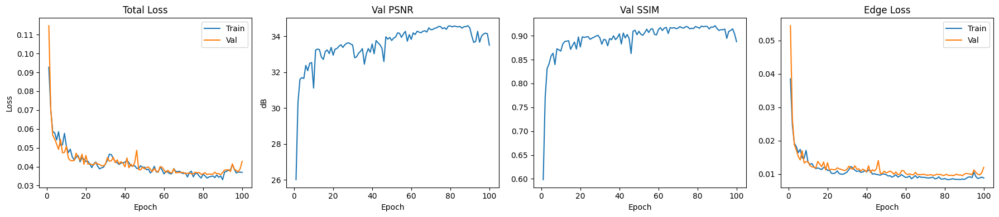

In [35]:
epochs_range = range(1, len(history["train_total_loss"]) + 1)

plt.figure(figsize=(18, 4))

plt.subplot(1, 4, 1)
plt.plot(epochs_range, history["train_total_loss"], label="Train")
plt.plot(epochs_range, history["val_total_loss"],   label="Val")
plt.title("Total Loss"); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()

plt.subplot(1, 4, 2)
plt.plot(epochs_range, history["val_psnr"])
plt.title("Val PSNR"); plt.xlabel("Epoch"); plt.ylabel("dB")

plt.subplot(1, 4, 3)
plt.plot(epochs_range, history["val_ssim"])
plt.title("Val SSIM"); plt.xlabel("Epoch")

plt.subplot(1, 4, 4)
plt.plot(epochs_range, history["train_edge_loss"], label="Train")
plt.plot(epochs_range, history["val_edge_loss"],   label="Val")
plt.title("Edge Loss"); plt.xlabel("Epoch"); plt.legend()

plt.tight_layout()
plt.show()

## Detailed Training Curves

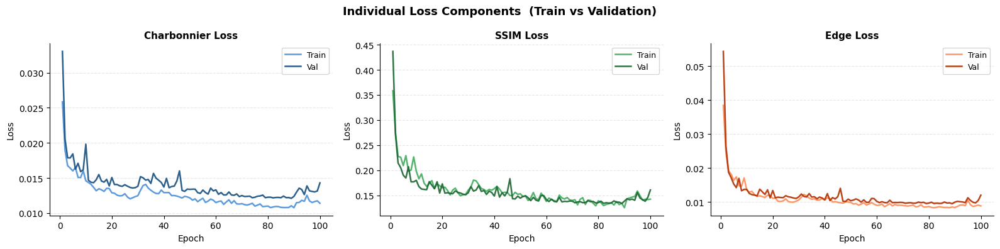

In [36]:
_ep_r = range(1, len(history["train_total_loss"]) + 1)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
fig.suptitle("Individual Loss Components  (Train vs Validation)",
             fontsize=13, fontweight="bold")

_comps = [
    ("charb_loss", "Charbonnier Loss", "#4A90D9", "#154f80"),
    ("ssim_loss",  "SSIM Loss",        "#41AB5D", "#1a6630"),
    ("edge_loss",  "Edge Loss",        "#FC8D59", "#b33000"),
]
for ax, (key, title, c_tr, c_val) in zip(axes, _comps):
    ax.plot(_ep_r, history[f"train_{key}"], color=c_tr,  linewidth=1.8, label="Train", alpha=0.9)
    ax.plot(_ep_r, history[f"val_{key}"],   color=c_val, linewidth=1.8, label="Val",   alpha=0.9)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.set_xlabel("Epoch", fontsize=10); ax.set_ylabel("Loss", fontsize=10)
    ax.legend(fontsize=9)
    ax.spines[["top", "right"]].set_visible(False)
    ax.yaxis.grid(True, linestyle="--", alpha=0.3); ax.set_axisbelow(True)

plt.tight_layout()
plt.show()


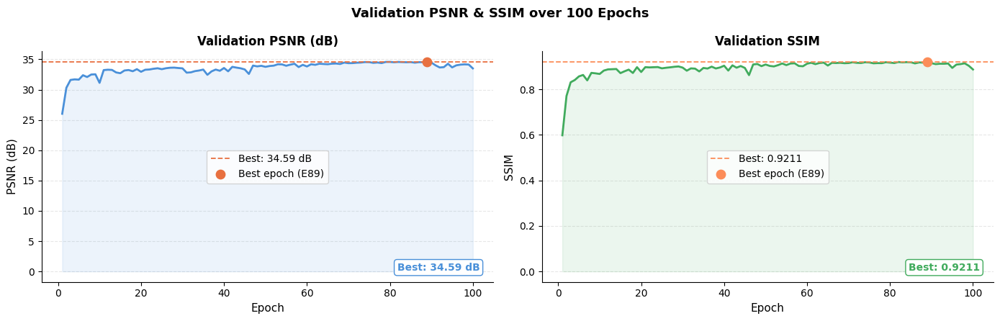

In [37]:
_ep_r      = range(1, len(history["val_psnr"]) + 1)
_best_psnr = max(history["val_psnr"])
_best_ep_p = history["val_psnr"].index(_best_psnr) + 1
_best_ssim = max(history["val_ssim"])
_best_ep_s = history["val_ssim"].index(_best_ssim) + 1

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4.5))
fig.suptitle("Validation PSNR & SSIM over 100 Epochs",
             fontsize=13, fontweight="bold")

ax1.plot(_ep_r, history["val_psnr"], color="#4A90D9", linewidth=2.0)
ax1.fill_between(_ep_r, history["val_psnr"], alpha=0.10, color="#4A90D9")
ax1.axhline(_best_psnr, color="#E87040", linestyle="--", linewidth=1.3,
            label=f"Best: {_best_psnr:.2f} dB")
ax1.scatter([_best_ep_p], [_best_psnr], color="#E87040", zorder=5, s=80,
            label=f"Best epoch (E{_best_ep_p})")
ax1.set_xlabel("Epoch", fontsize=11); ax1.set_ylabel("PSNR (dB)", fontsize=11)
ax1.set_title("Validation PSNR (dB)", fontsize=12, fontweight="bold")
ax1.legend(fontsize=10)
ax1.text(0.97, 0.05, f"Best: {_best_psnr:.2f} dB",
         transform=ax1.transAxes, ha="right", fontsize=10,
         color="#4A90D9", fontweight="bold",
         bbox=dict(fc="white", ec="#4A90D9", boxstyle="round,pad=0.3"))
ax1.spines[["top", "right"]].set_visible(False)
ax1.yaxis.grid(True, linestyle="--", alpha=0.3); ax1.set_axisbelow(True)

ax2.plot(_ep_r, history["val_ssim"], color="#41AB5D", linewidth=2.0)
ax2.fill_between(_ep_r, history["val_ssim"], alpha=0.10, color="#41AB5D")
ax2.axhline(_best_ssim, color="#FC8D59", linestyle="--", linewidth=1.3,
            label=f"Best: {_best_ssim:.4f}")
ax2.scatter([_best_ep_s], [_best_ssim], color="#FC8D59", zorder=5, s=80,
            label=f"Best epoch (E{_best_ep_s})")
ax2.set_xlabel("Epoch", fontsize=11); ax2.set_ylabel("SSIM", fontsize=11)
ax2.set_title("Validation SSIM", fontsize=12, fontweight="bold")
ax2.legend(fontsize=10)
ax2.text(0.97, 0.05, f"Best: {_best_ssim:.4f}",
         transform=ax2.transAxes, ha="right", fontsize=10,
         color="#41AB5D", fontweight="bold",
         bbox=dict(fc="white", ec="#41AB5D", boxstyle="round,pad=0.3"))
ax2.spines[["top", "right"]].set_visible(False)
ax2.yaxis.grid(True, linestyle="--", alpha=0.3); ax2.set_axisbelow(True)

plt.tight_layout()
plt.show()


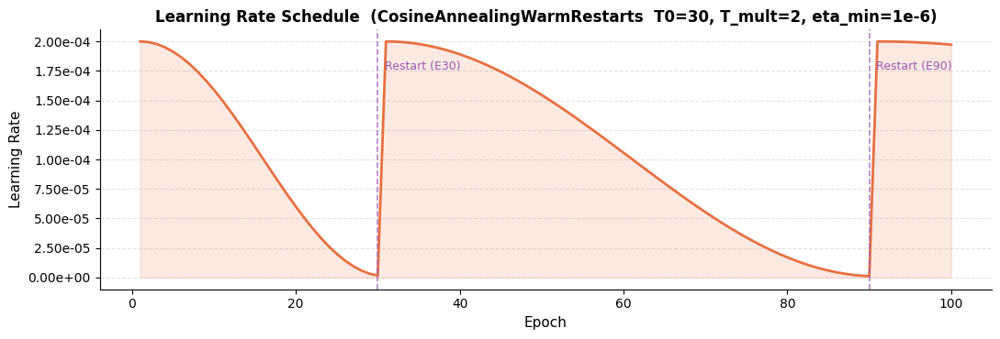

In [38]:
import matplotlib.ticker as ticker

_dm = torch.nn.Linear(1, 1)
_do = torch.optim.AdamW(_dm.parameters(), lr=2e-4)
_ds = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    _do, T_0=30, T_mult=2, eta_min=1e-6
)
_lrs = []
for _ in range(100):
    _lrs.append(_do.param_groups[0]["lr"])
    _ds.step()

fig, ax = plt.subplots(figsize=(11, 3.8))
ax.plot(range(1, 101), _lrs, color="#E87040", linewidth=2.0)
ax.fill_between(range(1, 101), _lrs, alpha=0.15, color="#E87040")
for _re, _rt in [(30, "Restart (E30)"), (90, "Restart (E90)")]:
    ax.axvline(_re, color="#9B59B6", linestyle="--", linewidth=1.2, alpha=0.75)
    ax.text(_re + 0.8, max(_lrs) * 0.88, _rt, fontsize=9, color="#9B59B6")
ax.set_xlabel("Epoch", fontsize=11)
ax.set_ylabel("Learning Rate", fontsize=11)
ax.set_title("Learning Rate Schedule  (CosineAnnealingWarmRestarts  T0=30, T_mult=2, eta_min=1e-6)",
             fontsize=12, fontweight="bold")
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter("%.2e"))
ax.spines[["top", "right"]].set_visible(False)
ax.yaxis.grid(True, linestyle="--", alpha=0.35); ax.set_axisbelow(True)
plt.tight_layout()
plt.show()


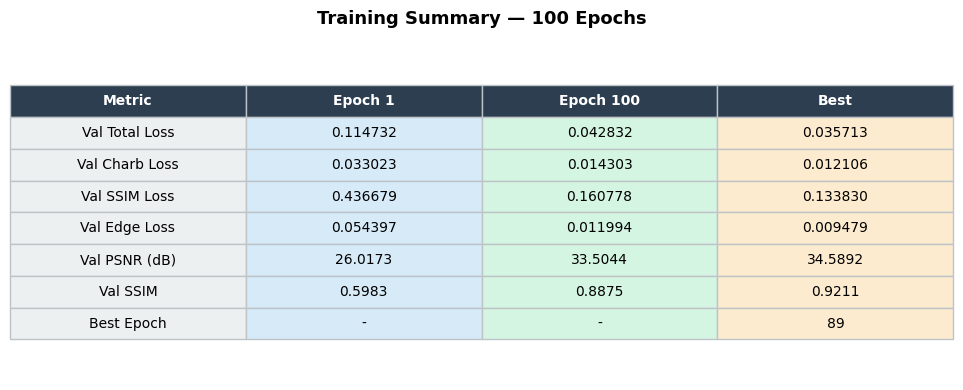

In [39]:
_best_ep   = history["val_psnr"].index(max(history["val_psnr"])) + 1
_best_psnr = max(history["val_psnr"])
_best_ssim = max(history["val_ssim"])

fig, ax = plt.subplots(figsize=(10, 4))
ax.axis("off")

_tbl = [
    ["Metric",              "Epoch 1",                                   "Epoch 100",                                "Best"],
    ["Val Total Loss",      f"{history['val_total_loss'][0]:.6f}",      f"{history['val_total_loss'][-1]:.6f}",   f"{min(history['val_total_loss']):.6f}"],
    ["Val Charb Loss",      f"{history['val_charb_loss'][0]:.6f}",      f"{history['val_charb_loss'][-1]:.6f}",   f"{min(history['val_charb_loss']):.6f}"],
    ["Val SSIM Loss",       f"{history['val_ssim_loss'][0]:.6f}",       f"{history['val_ssim_loss'][-1]:.6f}",    f"{min(history['val_ssim_loss']):.6f}"],
    ["Val Edge Loss",       f"{history['val_edge_loss'][0]:.6f}",       f"{history['val_edge_loss'][-1]:.6f}",    f"{min(history['val_edge_loss']):.6f}"],
    ["Val PSNR (dB)",       f"{history['val_psnr'][0]:.4f}",            f"{history['val_psnr'][-1]:.4f}",         f"{_best_psnr:.4f}"],
    ["Val SSIM",            f"{history['val_ssim'][0]:.4f}",            f"{history['val_ssim'][-1]:.4f}",         f"{_best_ssim:.4f}"],
    ["Best Epoch",          "-",                                          "-",                                        str(_best_ep)],
]

_cc = [["#ECF0F1", "#D6EAF8", "#D5F5E3", "#FDEBD0"]] * (len(_tbl) - 1)
_t  = ax.table(cellText=_tbl[1:], colLabels=_tbl[0], loc="center",
               cellLoc="center", cellColours=_cc)
_t.auto_set_font_size(False); _t.set_fontsize(10); _t.scale(1.35, 1.75)
for (_r, _c), _cell in _t.get_celld().items():
    if _r == 0:
        _cell.set_facecolor("#2C3E50")
        _cell.set_text_props(color="white", fontweight="bold")
    _cell.set_edgecolor("#BDC3C7")

ax.set_title("Training Summary — 100 Epochs",
             fontsize=13, fontweight="bold", pad=15)
plt.tight_layout()
plt.show()


## Load best model and evaluate

In [40]:
checkpoint = torch.load(best_model_path, map_location=device)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Best model loaded from :", best_model_path)
print("Best epoch             :", checkpoint["epoch"])
print(f"Best PSNR              : {checkpoint['best_psnr']:.4f} dB")

Best model loaded from : /content/checkpoints_denoising_proposed/proposed_denoiser_best.pth
Best epoch             : 89
Best PSNR              : 34.5892 dB


In [41]:
@torch.no_grad()
def show_predictions(model, loader, device, num_samples=3):
    model.eval()
    shown = 0

    for noisy_batch, gt_batch in loader:
        noisy_batch = noisy_batch.to(device)
        gt_batch    = gt_batch.to(device)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            out_batch = model(noisy_batch)

        for i in range(noisy_batch.size(0)):
            input_psnr  = calculate_psnr_torch(noisy_batch[i:i+1].float(), gt_batch[i:i+1].float())
            output_psnr = calculate_psnr_torch(out_batch[i:i+1].float(),   gt_batch[i:i+1].float())
            input_ssim  = calculate_ssim_torch(noisy_batch[i:i+1].float(), gt_batch[i:i+1].float())
            output_ssim = calculate_ssim_torch(out_batch[i:i+1].float(),   gt_batch[i:i+1].float())

            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            axes[0].imshow(tensor_to_image(noisy_batch[i]))
            axes[0].set_title(f"Noisy input\nPSNR {input_psnr:.2f} dB  SSIM {input_ssim:.3f}")
            axes[0].axis("off")

            axes[1].imshow(tensor_to_image(out_batch[i].float()))
            axes[1].set_title(f"Denoised output\nPSNR {output_psnr:.2f} dB  SSIM {output_ssim:.3f}")
            axes[1].axis("off")

            axes[2].imshow(tensor_to_image(gt_batch[i]))
            axes[2].set_title("Ground truth")
            axes[2].axis("off")

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= num_samples:
                return


show_predictions(model, val_loader, device, num_samples=5)

Output hidden; open in https://colab.research.google.com to view.

In [42]:
@torch.no_grad()
def evaluate_model(model, loader, device):
    model.eval()
    total_in_psnr = total_out_psnr = 0.0
    total_in_ssim = total_out_ssim = 0.0
    count = 0

    for noisy, gt in tqdm(loader, desc="Evaluating"):
        noisy = noisy.to(device)
        gt    = gt.to(device)

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            output = model(noisy)

        for i in range(noisy.size(0)):
            n = noisy[i:i+1].float()
            o = output[i:i+1].float()
            g = gt[i:i+1].float()

            total_in_psnr  += calculate_psnr_torch(n, g)
            total_out_psnr += calculate_psnr_torch(o, g)
            total_in_ssim  += calculate_ssim_torch(n, g)
            total_out_ssim += calculate_ssim_torch(o, g)
            count += 1

    print(f"Avg PSNR  Input  : {total_in_psnr  / count:.4f} dB")
    print(f"Avg PSNR  Output : {total_out_psnr / count:.4f} dB")
    print(f"Avg PSNR  Gain   : {(total_out_psnr - total_in_psnr) / count:+.4f} dB")
    print(f"Avg SSIM  Input  : {total_in_ssim  / count:.4f}")
    print(f"Avg SSIM  Output : {total_out_ssim / count:.4f}")
    print(f"Avg SSIM  Gain   : {(total_out_ssim - total_in_ssim) / count:+.4f}")


evaluate_model(model, val_loader, device)

Evaluating:   0%|          | 0/8 [00:00<?, ?it/s]

/tmp/ipykernel_86130/794428661.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


Avg PSNR  Input  : 27.6622 dB
Avg PSNR  Output : 36.4621 dB
Avg PSNR  Gain   : +8.7999 dB
Avg SSIM  Input  : 0.5558
Avg SSIM  Output : 0.9211
Avg SSIM  Gain   : +0.3653


## Save to Drive

In [ ]:
drive_save_dir = "/content/drive/MyDrive/PixelClear/Noise-Removal-Model/saved_models/proposed_denoiser-v2"
os.makedirs(drive_save_dir, exist_ok=True)

best_model_drive_path = os.path.join(drive_save_dir, "proposed_denoiser_best.pth")
last_model_drive_path = os.path.join(drive_save_dir, "proposed_denoiser_last.pth")
history_drive_path    = os.path.join(drive_save_dir, "proposed_denoiser_history.json")
summary_drive_path    = os.path.join(drive_save_dir, "proposed_denoiser_summary.json")

if os.path.exists(best_model_path):
    shutil.copy2(best_model_path, best_model_drive_path)
    print("Best model saved to:", best_model_drive_path)

if os.path.exists(last_model_path):
    shutil.copy2(last_model_path, last_model_drive_path)
    print("Latest model saved to:", last_model_drive_path)

with open(history_drive_path, "w") as f:
    json.dump(history, f, indent=2)
print("History saved to:", history_drive_path)

summary_info = {
    "model_name"           : "LightweightResidualDenoiser v2 (InstanceNorm + SE + Charbonnier + edge)",
    "num_params"           : num_params,
    "best_val_psnr"        : float(best_val_psnr),
    "final_val_psnr"       : float(history["val_psnr"][-1]),
    "final_val_ssim"       : float(history["val_ssim"][-1]),
    "epochs_trained"       : len(history["train_total_loss"]),
    "patch_size"           : PATCH_SIZE,
    "batch_size"           : BATCH_SIZE
}

with open(summary_drive_path, "w") as f:
    json.dump(summary_info, f, indent=2)
print("Summary saved to:", summary_drive_path)

## Inference on custom uploaded image

In [44]:
def save_image_from_array(img_array, save_path):
    img_uint8 = (np.clip(img_array, 0, 1) * 255).astype(np.uint8)
    Image.fromarray(img_uint8).save(save_path)


@torch.no_grad()
def run_denoising_inference(model, image_path, device):
    model.eval()
    img        = load_image_rgb(image_path)
    img_tensor = image_to_tensor(img).unsqueeze(0).to(device)

    with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
        output_tensor = model(img_tensor).float()

    output_img = output_tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    return img, np.clip(output_img, 0, 1)

In [47]:
from google.colab import files

uploaded = files.upload()

uploaded_filenames = list(uploaded.keys())
if not uploaded_filenames:
    raise ValueError("No file uploaded.")

custom_image_path = "/content/" + uploaded_filenames[0]
print("Uploaded image path:", custom_image_path)

Saving WhatsApp Image 2026-03-24 at 22.26.28.jpeg to WhatsApp Image 2026-03-24 at 22.26.28.jpeg
Uploaded image path: /content/WhatsApp Image 2026-03-24 at 22.26.28.jpeg


/tmp/ipykernel_86130/3978873100.py:12: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


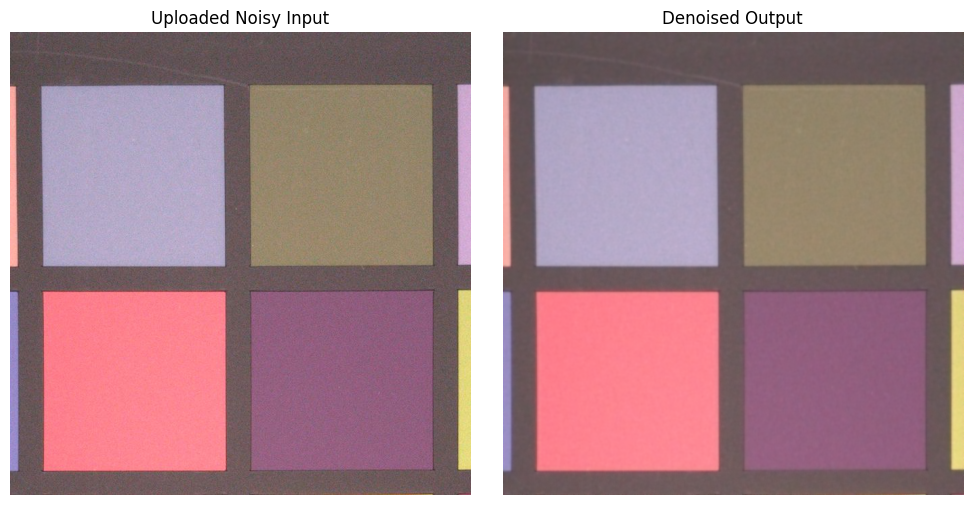

In [48]:
noisy_img, denoised_img = run_denoising_inference(model, custom_image_path, device)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(noisy_img)
plt.title("Uploaded Noisy Input")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(denoised_img)
plt.title("Denoised Output")
plt.axis("off")

plt.tight_layout()
plt.show()